# 🤖 **Model Benchmark — BTC Target + ETH Cross-Asset + BTC Media**

### 🎯 **Objective**
Evaluate whether combining **ETH cross-asset features** and **BTC media features** improves **BTC crash prediction** beyond any single signal source.

### ⚠️ **Problem Definition**
Binary classification task on **BTC crashes**:

- `True` → BTC Crash (>10% drop within 7 days)
- `False` → No crash

### 🔬 **Benchmark Focus**
Test the **combined signal hypothesis**: ETH market dynamics + BTC media article volume together may provide better coverage of BTC crash risk than either alone. This is the richest BTC feature set tested.

### 📊 **Feature Set**

| Source | Features | Count |
|---|---|---|
| BTC market (notebook 01 EDA) | 17 standard market features | 17 |
| ETH cross-asset — engineered only (notebook 06 EDA) | 17 ETH features (raw OHLCV excluded) | 17 |
| BTC media (notebook 04 EDA) | `article_count_ma_3`, `article_count`, `article_count_lag_1`, `tone_ma_30`, `tone_ma_7`, `tone_lag_7`, `tone_lag_1` | 7 |
| **Total** | | **41** |

### 🚀 **Goal**
Determine whether combining ETH cross-asset + BTC media enrichment produces synergistic improvement over the individual signal sources. Raw OHLCV ETH features excluded (non-stationary); 17 engineered ETH features used.

In [10]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

### **1. Load BTC, ETH Price and BTC Media Data**

In [11]:
df_btc = pd.read_csv("../../data/gold/market/btc_usdt_1d_features.csv")
df_eth = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")
df_btc_media = pd.read_csv("../../data/gold/bitcoin_tone_gold.csv")

print(f"BTC price : {df_btc.shape[0]} rows, {df_btc.shape[1]} columns")
print(f"ETH price : {df_eth.shape[0]} rows, {df_eth.shape[1]} columns")
print(f"BTC media : {df_btc_media.shape[0]} rows, {df_btc_media.shape[1]} columns")

BTC price : 3115 rows, 30 columns
ETH price : 3114 rows, 30 columns
BTC media : 3145 rows, 9 columns


### **2. Merge BTC + ETH Price (inner join)**

In [12]:
df_btc["open_time"] = pd.to_datetime(df_btc["open_time"], errors="coerce")
df_eth["open_time"] = pd.to_datetime(df_eth["open_time"], errors="coerce")

eth_renamed = df_eth.rename(columns={c: f"{c}_eth" for c in df_eth.columns if c != "open_time"})

df = pd.merge(df_btc, eth_renamed, on="open_time", how="inner")
df.drop(columns=["target_eth"], inplace=True)

print(f"After BTC+ETH merge : {df.shape[0]} rows, {df.shape[1]} columns")

After BTC+ETH merge : 3114 rows, 58 columns


### **3. Add BTC Media (inner join)**

In [13]:
df_btc_media["date"] = pd.to_datetime(df_btc_media["date"], errors="coerce")
df_btc_media = (
    df_btc_media
    .dropna(subset=["date"])
    .sort_values("date")
    .drop_duplicates("date", keep="last")
    .reset_index(drop=True)
)

min_date = df["open_time"].min()
max_date = df["open_time"].max()
df_btc_media = df_btc_media[
    (df_btc_media["date"] >= min_date) & (df_btc_media["date"] <= max_date)
].copy()

df = pd.merge(df, df_btc_media, left_on="open_time", right_on="date", how="inner")
df.drop(columns=["open_time", "date"], inplace=True)

print(f"After adding BTC media : {df.shape[0]} rows, {df.shape[1]} columns")
df.head()

After adding BTC media : 3114 rows, 65 columns


,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,return_1d,...,ma_30_eth,ma_ratio_eth,avg_tone,article_count,tone_ma_7,tone_ma_30,tone_lag_1,tone_lag_7,article_count_ma_3,article_count_lag_1
0,3674.01,3950.00,3470.66,3714.95,1297.563953,4.804878e+06,8809,624.887842,2.314536e+06,0.004041,...,315.714667,0.850311,-1.715865,372,-1.895764,-0.872188,-2.099644,-1.382756,776.666667,1020
1,3685.23,3748.21,3499.02,3699.99,682.171210,2.466490e+06,6355,273.931976,9.948436e+05,-0.004027,...,314.501000,0.837263,-1.658053,287,-1.998736,-0.911391,-1.715865,-0.937248,559.666667,372
2,3690.00,4123.20,3690.00,4035.01,1030.006455,4.069033e+06,8220,417.638722,1.651863e+06,0.090546,...,314.623000,0.835699,-1.314142,634,-1.939380,-0.948492,-1.658053,-1.729629,431.000000,287
3,4060.00,4089.97,3830.91,3910.04,902.332129,3.558315e+06,7342,257.320352,1.016804e+06,-0.030971,...,314.119667,0.832508,-1.070752,586,-1.777034,-0.988215,-1.314142,-2.207177,502.333333,634
4,3910.04,4046.08,3820.00,3900.00,720.935076,2.839584e+06,7231,395.275138,1.562210e+06,-0.002568,...,312.743333,0.838497,-0.978995,400,-1.599995,-1.017923,-1.070752,-2.218269,540.000000,586


### **4. Feature Selection**

- **17 BTC market** — from `01_model_benchmark_btc.ipynb`
- **17 ETH cross-features (engineered only)** — from `06_eda_btc_with_eth.ipynb` (all 28 passed threshold, none redundant)
- **7 BTC media** — from `04_eda_btc_price_and_media.ipynb` (`avg_tone` excluded: score < 0.10)

In [14]:
SELECTED_FEATURES = [
    # BTC market features (17)
    "return_1d", "return_7d",
    "volatility_7d", "volatility_30d",
    "buy_pressure",
    "drawdown",
    "ma_ratio",
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # ETH cross-features — engineered only (17, mirrors BTC feature categories)
    # Raw OHLCV (high/open/low/close/volume) and absolute MAs (ma_7/ma_30) excluded
    "momentum_volatility_eth", "return_7d_eth", "lag_return_7d_eth",
    "volatility_30d_eth", "volatility_7d_eth", "lag_volatility_7d_eth",
    "lag_volume_norm_eth", "pressure_x_return_eth", "volume_norm_eth",
    "return_1d_eth", "lag_return_1d_eth", "drawdown_eth",
    "ma_ratio_eth", "volatility_ratio_eth",
    "buy_pressure_eth", "lag_buy_pressure_eth", "momentum_acc_eth",

    # BTC media enrichment (7) — from 04_eda_btc_price_and_media.ipynb
    "article_count_ma_3",
    "article_count",
    "article_count_lag_1",
    "tone_ma_30",
    "tone_ma_7",
    "tone_lag_7",
    "tone_lag_1",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

Dataset shape : (3114, 42)
Target distribution:
target
0    2734
1     380
Name: count, dtype: int64


Series([], dtype: int64)

### **5. Model Benchmark**


=== Confusion matrix (OOF, global) — dummy ===


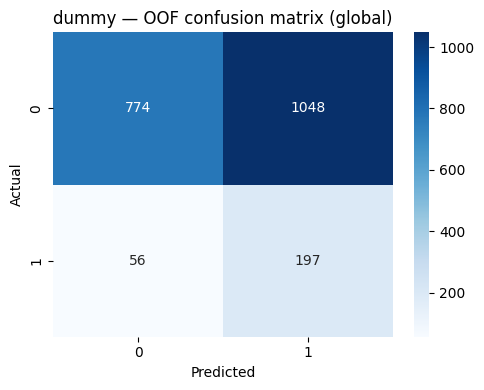


=== Confusion matrix (OOF, global) — logistic ===


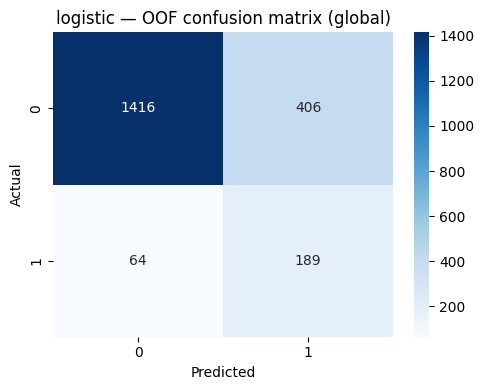


=== Confusion matrix (OOF, global) — random_forest ===


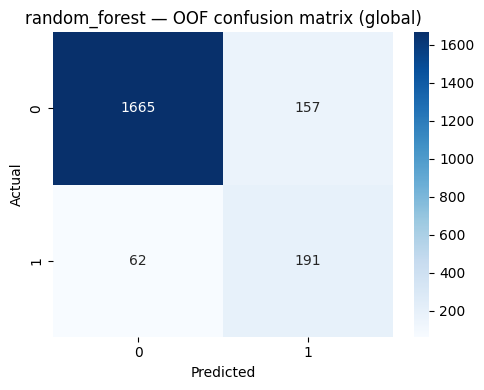


=== Confusion matrix (OOF, global) — xgboost ===


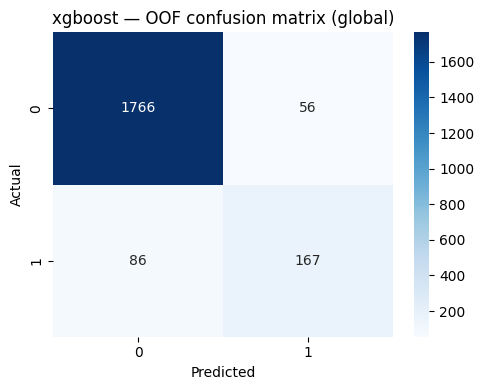

[LightGBM] [Info] Number of positive: 105, number of negative: 311
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5686
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 41
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.252404 -> initscore=-1.085833
[LightGBM] [Info] Start training from score -1.085833
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

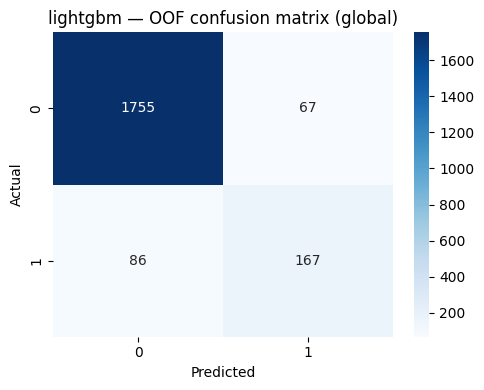


=== Confusion matrix (OOF, global) — catboost ===


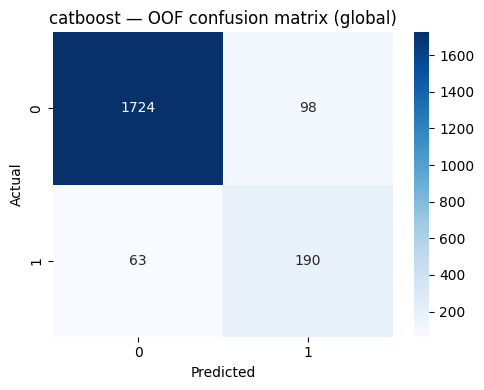

,precision,recall,f1,TP,FP,FN,TN,pr_auc
catboost,0.659722,0.750988,0.702403,190.000000,98.000000,63.000000,1724.000000,0.754801
lightgbm,0.713675,0.660079,0.685832,167.000000,67.000000,86.000000,1755.000000,0.753656
xgboost,0.748879,0.660079,0.701681,167.000000,56.000000,86.000000,1766.000000,0.748585
random_forest,0.548851,0.754941,0.635607,191.000000,157.000000,62.000000,1665.000000,0.722235
logistic,0.317647,0.747036,0.445755,189.000000,406.000000,64.000000,1416.000000,0.473449
dummy,0.158233,0.778656,0.263017,197.000000,1048.000000,56.000000,774.000000,0.148498
mean,0.524501,0.725296,0.572382,183.500000,305.333333,69.500000,1516.666667,0.600204
std,0.216776,0.047197,0.164435,11.940826,352.525964,11.940826,352.525964,0.225263


In [15]:
results = run_benchmark_pipeline(df, verbose=False, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# Summary rows
results_df.loc["mean"] = results_df.select_dtypes("number").mean()
results_df.loc["std"]  = results_df.select_dtypes("number").std()

results_df